In [1]:
import numpy as np
from PIL import Image
#import tensorflow as tf
from PIL import Image, ImageDraw
import skimage.filters as filters
# for additional data augmentation
from skimage import data, exposure, img_as_float
import random
from skimage.transform import rescale, resize
from skimage.util import random_noise
import functools
from itertools import chain, combinations
from skimage.filters.rank import median
from skimage.morphology import disk
from PIL import Image, ImageFont, ImageDraw, ImageEnhance

import aug_util as aug
import wv_util as wv
import matplotlib.pyplot as plt
import numpy as np
import csv
%matplotlib inline
#import matplotlib, copy, skimage, os, tifffile
from skimage import io, morphology, draw
import gdal
from PIL import Image
import random
from skimage.filters.rank import median
from skimage.morphology import disk
import json
from tqdm import tqdm

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #2
  (fname, cnt))
/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #3
  (fname, cnt))


In [2]:
fname = '../bboxes_tomnod_2class_noclean.geojson'
#fname = '../added_non_damaged_cleaned.geojson'
coords, chips, classes, uids = wv.get_labels_w_uid_nondamaged(fname)

100%|██████████| 126937/126937 [00:00<00:00, 148846.89it/s]


/home/ubuntu/anyan/harvey_data/filtered_converted_image/20170831_105001000B95E100_3020213_jpeg_compressed_03_01.tif


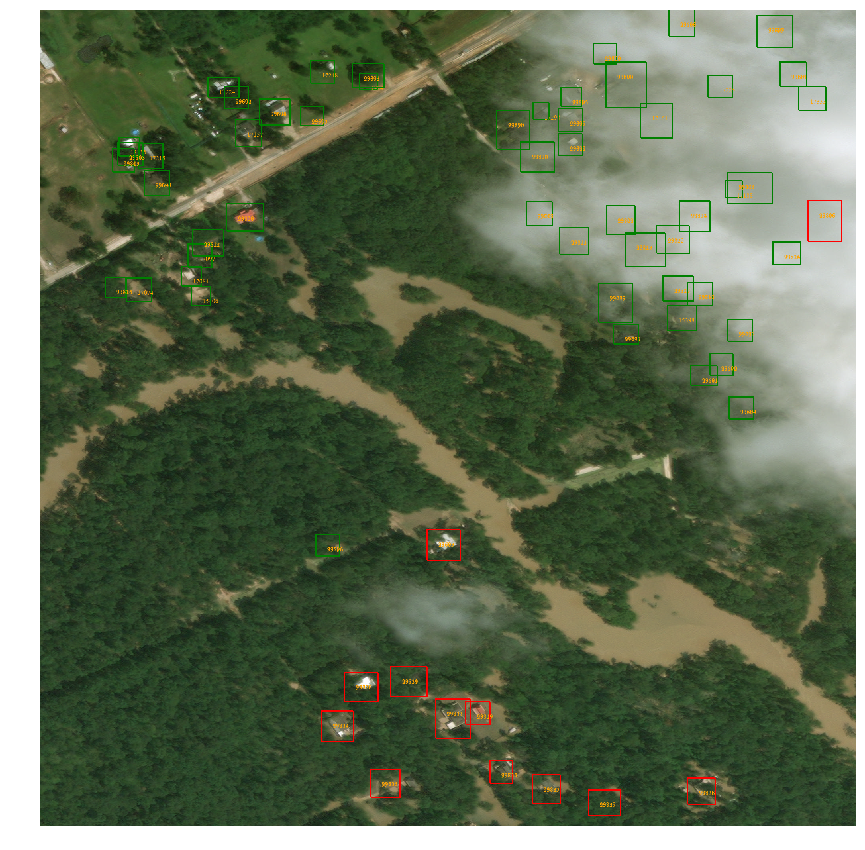

In [3]:
#Load an image
path = '/home/ubuntu/anyan/harvey_data/filtered_converted_image/'
#chip_name = '20170829_1040010032211E00_2112023_jpeg_compressed_10_10.tif' # with blackout
#chip_name = '20170831_105001000B95E100_3020021_jpeg_compressed_06_01.tif'
#chip_name = '20170831_105001000B95E100_3020021_jpeg_compressed_04_04.tif'
#chip_name = '20170831_105001000B95E100_3020021_jpeg_compressed_05_02.tif'
#chip_name = '20170831_105001000B95E100_3020021_jpeg_compressed_05_04.tif'
#chip_name = '20170831_105001000B95E100_3020021_jpeg_compressed_06_02.tif'
#chip_name = '20170902_105001000B9D7E00_3030322_jpeg_compressed_01_09.tif'
#chip_name = '20170902_105001000B9D7F00_3030321_jpeg_compressed_07_03.tif'
#chip_name = '20170902_105001000B9D7E00_3030211_jpeg_compressed_07_09.tif'
#chip_name = '20170901_1030010070C13600_3030230_jpeg_compressed_02_07.tif'
#chip_name = '20170902_105001000B9D7E00_3030320_jpeg_compressed_08_05.tif'
#chip_name = '20170831_105001000B95E200_3002233_jpeg_compressed_10_10.tif'  # shift to right
#chip_name = '20170902_105001000B9D7F00_3030321_jpeg_compressed_06_04.tif'  # all clouds
#chip_name = '20170831_105001000B95E200_3020123_jpeg_compressed_04_09.tif'  # completely off
#chip_name = '20170831_105001000B95E100_3020021_jpeg_compressed_05_02.tif'  # shift to right
#chip_name = '20170831_105001000B95E200_3002321_jpeg_compressed_02_03.tif'  # shift to right
#chip_name = '20170829_1040010032211E00_2110222_jpeg_compressed_02_05.tif'  # perfect fit
#chip_name = '20170831_105001000B95E200_3020132_jpeg_compressed_04_02.tif'  # shift to right, invalid bboxes
#chip_name  = '20170831_105001000B95E200_3020132_jpeg_compressed_06_03.tif'  # shift to right
#chip_name = '20170831_105001000B95E200_3020132_jpeg_compressed_10_01.tif' # shift to right
chip_name = '20170831_105001000B95E100_3020213_jpeg_compressed_03_01.tif'  # clouds
#chip_name = '20170831_105001000B95E200_3002320_jpeg_compressed_02_02.tif' # shift to right
#chip_name = '20170831_105001000B95E200_3020100_jpeg_compressed_07_08.tif'  # clouds
#chip_name = '20170829_1040010032211E00_2112000_jpeg_compressed_08_05.tif'  # AlL  clouds
#chip_name = '20170829_1040010032211E00_2110223_jpeg_compressed_06_05.tif'  # clouds


chip_fullname = path + chip_name
print(chip_fullname)
arr = wv.get_image(chip_fullname)
coords_chip = coords[chips==chip_name]
# print(coords_chip)

classes_chip = classes[chips==chip_name].astype(np.int64)
uids_chip = uids[chips == chip_name].astype(np.int64)
#labelled = aug.draw_bboxes(arr,coords_chip[classes_chip ==1])
labelled = aug.draw_bboxes_withindex_multiclass(arr,coords_chip,classes_chip, uids_chip)

#labelled = aug.draw_bboxes(arr,coords[classes ==1])
plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(labelled)

In [17]:
# given a 2048 tif and its labels, chip it to small images that centered with each
# bounding boxes
# resolution
def crop_from_center(img,coords_chip,classes_chip, uids_chip, resolution = (200,200)):
    w = img.shape[0]
    h = img.shape[1]
    crop_w, crop_h = resolution
    threshold = 20  # threshold of # of pixels to discard bbox
    boxes = np.array(coords_chip)
    print('number of bboxes: ', boxes.shape[0])
    images = np.zeros((coords_chip.shape[0],crop_w,crop_h,3))
    total_boxes = {}
    total_classes = {}
    k = 0
    for i in range(boxes.shape[0]):
        xmin, ymin, xmax, ymax = boxes[i]
#         bbox_x_center = (xmin + xmax)/2
#         bbox_y_center = (ymin + ymax) /2
        bbox_y_center = (xmin + xmax)/2
        bbox_x_center = (ymin + ymax) /2
        # force the crop to be square and contain the chosen bbox
        if bbox_x_center < 1/2 * crop_w:
             # start from leftmost
            startx = 0
            endx = int(startx + crop_w)
            # should consider the case: if endx < xmax
        elif bbox_x_center > w - 1/2 * crop_w:
            endx = w
            startx = int(w - crop_w)
           
        else:
            endx = int(bbox_x_center + 1/2 * crop_w)
            #startx = int(w - crop_w)
            startx = int(bbox_x_center - 1/2 * crop_w)
        if bbox_y_center < 1/2 * crop_h:
            starty = 0
            endy = int(starty + crop_h)
        elif bbox_y_center > int(h - 1/2 *crop_h):
            endy = h
            starty = int(endy - crop_h)
        else:
            endy = int(bbox_y_center + 1/2 * crop_h)
            starty = int(bbox_y_center - 1/2 * crop_h)
        newimg = img[startx: endx, starty: endy]
        newboxes = []
        newclasses = []
       
        #boxes = np.array(coords_chip)  # change to np array, otherwise, boxes[:,0] cannot access list
        x = np.logical_or( np.logical_and( (boxes[:,0]<endy),  (boxes[:,0]>starty)),
                                   np.logical_and((boxes[:,2]<endy),  (boxes[:,2]>starty)))
        out = boxes[x]
        y = np.logical_or( np.logical_and(  (out[:,1]<endx),  (out[:,1]>startx)),
                                   np.logical_and((out[:,3]<endx),  (out[:,3]>startx)))
        outn = out[y]
        out = np.transpose(np.vstack((np.clip(outn[:,0]-starty,0,crop_w),
                                              np.clip(outn[:,1]-startx,0, crop_h),
                                              np.clip(outn[:,2]-starty,0,crop_w),
                                              np.clip(outn[:,3]-startx,0, crop_h))))
        box_classes = classes_chip[x][y]
        # remove bboxes that only have less than 20 pixels in w/h left in the image
        # only loop through ones that have 0 or wn/hn in the 4 coordinates
        rows_to_delete = list()
        for m in range(out.shape[0]):
            if(np.any([out[m] == 0]) or np.any([out[m] == crop_w]) or np.any([out[m] == crop_h])):
             # see whether the width of bbox is less than 10 pixels?
                bbox_w = out[m][2] - out[m][0]
                bbox_h = out[m][3] - out[m][1]
                if bbox_w < threshold or bbox_h < threshold:
                    rows_to_delete.append(m)

        # discard this bbox

        out = np.delete(out, rows_to_delete, axis=0)
        box_classes = np.delete(box_classes, rows_to_delete, axis=0)

        if out.shape[0] != 0:
            newboxes = out
            newclasses = box_classes
        else:
            newboxes= np.array([[0,0,0,0]])
            newclasses = np.array([0])
            # check whether there are any bboxes on the image, if not, discard
        newimg, new_bboxes, new_classes = aug.check_bbox_validity(newimg, newboxes, newclasses)
        if len(new_bboxes) != 0:

            images[k] = newimg
            total_boxes[k] = new_bboxes
            total_classes[k] = new_classes
 
            print("processing round: ", k)
            k = k+1

    # only retain k images
    final_aug_num = len(total_boxes)
    print('final number: ',final_aug_num )
    images = images[0:final_aug_num]

    return images.astype(np.uint8),total_boxes,total_classes



number of bboxes:  114
processing round:  0
processing round:  1
processing round:  2
processing round:  3
processing round:  4
processing round:  5
processing round:  6
processing round:  7
processing round:  8
processing round:  9
processing round:  10
processing round:  11
processing round:  12
processing round:  13
processing round:  14
processing round:  15
processing round:  16
processing round:  17
processing round:  18
processing round:  19
processing round:  20
processing round:  21
processing round:  22
processing round:  23
processing round:  24
processing round:  25
processing round:  26
processing round:  27
processing round:  28
processing round:  29
processing round:  30
processing round:  31
processing round:  32
processing round:  33
processing round:  34
processing round:  35
processing round:  36
processing round:  37
processing round:  38
processing round:  39
processing round:  40
processing round:  41
processing round:  42
processing round:  43
processing round:  

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


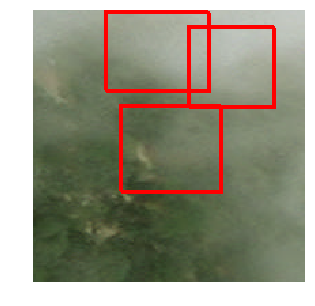

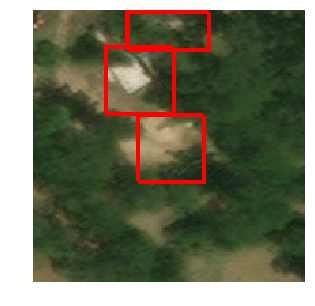

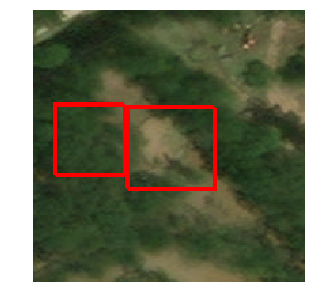

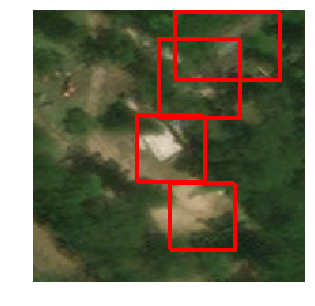

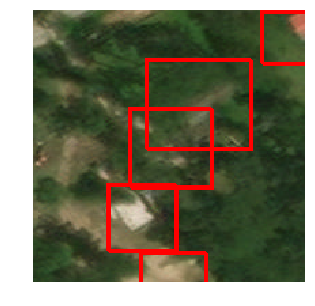

...

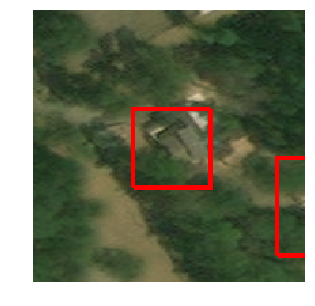

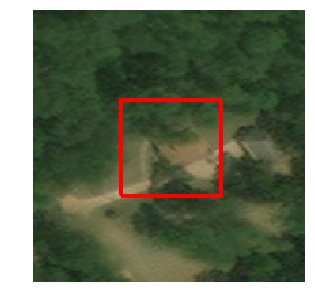

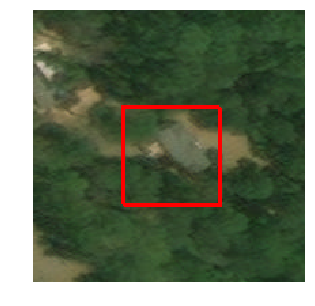

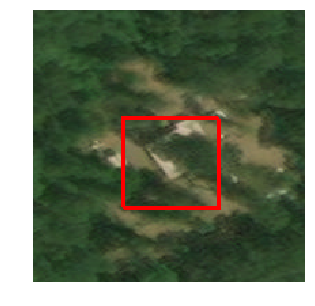

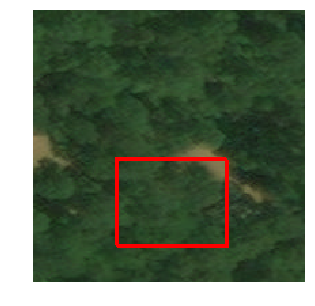

In [18]:
#We can chip the image into 500x500 chips
images,total_boxes,total_classes = crop_from_center(arr, coords_chip, classes_chip, uids_chip)
print("Num Chips: %d" % images.shape[0])


for ind in range(len(images)):
    #ind = np.random.choice(range(c_img.shape[0]))
    labelled = aug.draw_bboxes(images[ind],total_boxes[ind])
    plt.figure(figsize=(5,5))
    plt.axis('off')
    plt.imshow(labelled)